# Project: Detection of medical masks

## 1. Problem Statment

Facial recognition is a key area in computer vision and pattern recognition. Significant research in the past has contributed to the development of sophisticated facial recognition algorithms. With the development of convolutional networks, highly accurate image classification has become possible.

Beyond image labeling, there are often tasks where a specific object in the image is important. For example, due to the recent COVID-19 outbreak, wearing surgical masks has become mandatory for everyone outside their home, which in turn has led to the need to develop an approach for detecting masks on people's faces.

Imagine your company has the opportunity to help the world by training a model to detect whether people are wearing masks. You want to compare the two types of detectors studied (single-layer and two-layer) and present a short report to your management. To justify your choice of model to your colleagues, you decided to use the Intersection over Union and Average Precision metrics.

## 2. Import Libraries and Define Constants

In [103]:
import os
os.environ['NO_ALBUMENTATIONS_UPDATE'] = '1'
# os.environ['PYTORCH_ENABLE_MPS_FALLBACK'] = '1'

import numpy as np 
import pandas as pd 
import torchvision
from torchvision import transforms, datasets, models
import torch
from torchvision.ops import box_iou
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
import cv2
import glob
import xml.etree.ElementTree as et
from tqdm import tqdm


# Define devices
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print('Used device:', device)

# Define paths
images_dir = 'data/images/'
annotations_dir = 'data/annotations/'

# Torch random seed
random_seed = 42

# Selecting a low batch size due to hardware limitations
batch_size = 4

# background is located on the position 0
classes = [_, 'without_mask','with_mask','mask_weared_incorrect']

Used device: cpu


## 3. Loading Data to the DataLoader

In [104]:
class FaceMaskDataset(torch.utils.data.Dataset):


    def __init__(self, images_dir, annotation_dir, width, height, transforms=None):
        self.images_dir = images_dir
        self.annotation_dir = annotation_dir
        self.height = height
        self.width = width
        self.transforms = transforms
        
        # sort image file names
        self.imgs = [image for image in sorted(os.listdir(images_dir))]
        self.annotate = [image for image in sorted(os.listdir(annotation_dir))]
        

    def __getitem__(self, idx):
        img_name = self.imgs[idx]
        image_path = os.path.join(self.images_dir, img_name)

        # adjust image color scheme and size
        img = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        img_res = cv2.resize(img_rgb, (self.width, self.height), cv2.INTER_AREA)
        # normalize image
        img_res /= 255.0
        
        # load the annotation
        annot_filename = self.annotate[idx]
        annot_file_path = os.path.join(self.annotation_dir, annot_filename)
        
        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()
        
        # image width and height
        wt = img.shape[1]
        ht = img.shape[0]
        
        # loading bounding boxes
        for member in root.findall('object'):
            labels.append(classes.index(member.find('name').text))
            
            # bounding box
            xmin = int(member.find('bndbox').find('xmin').text)
            xmax = int(member.find('bndbox').find('xmax').text)
            
            ymin = int(member.find('bndbox').find('ymin').text)
            ymax = int(member.find('bndbox').find('ymax').text)
            
            xmin_corr = (xmin/wt)*self.width
            xmax_corr = (xmax/wt)*self.width
            ymin_corr = (ymin/ht)*self.height
            ymax_corr = (ymax/ht)*self.height
            
            xmin_corr = self.__clamp__(xmin_corr, 0, self.width-1)
            xmax_corr = self.__clamp__(xmax_corr, 0, self.width-1)
            ymin_corr = self.__clamp__(ymin_corr, 0, self.height-1)
            ymax_corr = self.__clamp__(ymax_corr, 0, self.height-1)

            boxes.append([xmin_corr, ymin_corr, xmax_corr, ymax_corr])
        
        # converting boxes to torch.Tensor format
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        area = (boxes[:, 3] - boxes[:, 1])*(boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd

        image_id = torch.tensor([idx])
        target["image_id"] = image_id
            
        if self.transforms:
            sample = {
                'image': img_res,
                'bboxes': target['boxes'],
                'labels': labels
            }
            sample = self.transforms(**sample)
            img_res = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])
            target['labels'] = torch.Tensor(sample['labels']).to(torch.int64)
        else:
            target['labels'] = torch.as_tensor(labels, dtype=torch.int64)

        return img_res, target

    def __len__(self):
        return len(self.imgs)
    
    
    def __clamp__(self, num, min_value, max_value):
        return max(min(num, max_value), min_value)


# instantiate dataset
dataset = FaceMaskDataset(images_dir, annotations_dir, 480, 480)
print('Length of dataset:', len(dataset), '\n')

# get a sample from the dataset
img, target = dataset[83]
print('Image shape:', img.shape, '\n', 'Target:', target)

Length of dataset: 853 

Image shape: (480, 480, 3) 
 Target: {'boxes': tensor([[ 57.6000, 153.4694,  86.4000, 189.3878],
        [397.2000, 125.7143, 427.2000, 173.0612]]), 'labels': tensor([2, 3]), 'area': tensor([1034.4490, 1420.4080]), 'iscrowd': tensor([0, 0]), 'image_id': tensor([83])}


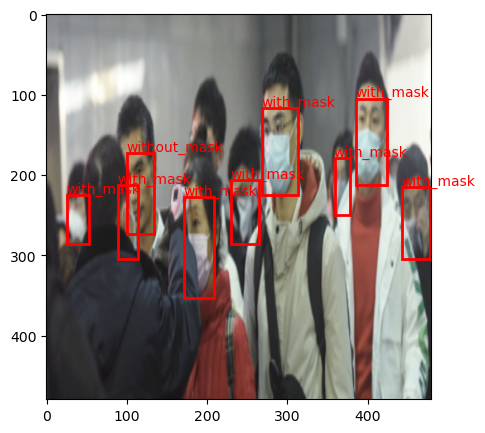

In [105]:
# Helper function to visualize bboxes
def plot_img_bbox(img, target):
    fig, im = plt.subplots(1,1)
    fig.set_size_inches(5,5)
    im.imshow(img)
    for i, box in enumerate(target['boxes']):
        x, y, width, height  = box[0], box[1], box[2]-box[0], box[3]-box[1]
        rect = patches.Rectangle((x, y),
                                 width, height,
                                 linewidth = 2,
                                 edgecolor = 'r',
                                 facecolor = 'none')

        im.add_patch(rect)
        im.text(int(box[0]),int(box[1]-2), classes[int(target['labels'][i])], color='red', fontsize=10)

    plt.show()


# visualize the 1st image and its target
img, target = dataset[1]
plot_img_bbox(img, target)

In [106]:
def get_transform(train):
    
    if train:
        return A.Compose([
                            A.HorizontalFlip(0.5),
                            A.RandomBrightnessContrast(p=0.2),
                            A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=30, p=0.5),
                            ToTensorV2(p=1.0) 
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
    else:
        return A.Compose([
                            ToTensorV2(p=1.0)
                        ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

In [107]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [108]:
max_items = len(dataset)

dataset = FaceMaskDataset(images_dir, annotations_dir, 480, 480, transforms=get_transform(train=True))
dataset_test = FaceMaskDataset(images_dir, annotations_dir, 480, 480, transforms=get_transform(train=False))

dataset = torch.utils.data.Subset(dataset, range(max_items))
dataset_test = torch.utils.data.Subset(dataset_test, range(max_items))

# split dataset into train and test set
torch.manual_seed(random_seed)
indices = torch.randperm(len(dataset)).tolist()

test_split = 0.2
tsize = int(len(dataset)*test_split)
dataset = torch.utils.data.Subset(dataset, indices[:-tsize])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-tsize:])

data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn
)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=batch_size, shuffle=False, collate_fn=collate_fn
)

/opt/miniconda3/envs/tensorflow_env/lib/python3.12/site-packages/albumentations/core/composition.py:205: UserWarning: Got processor for bboxes, but no transform to process it.
  self._set_keys()


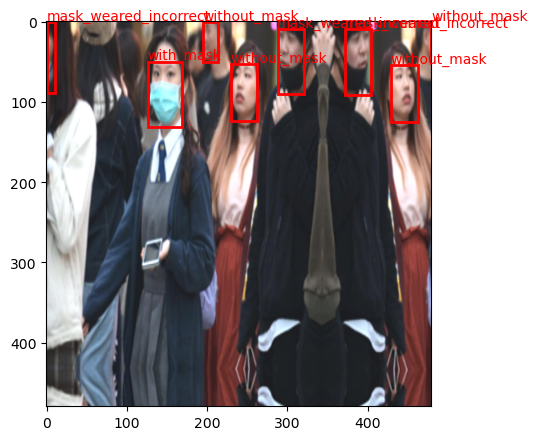

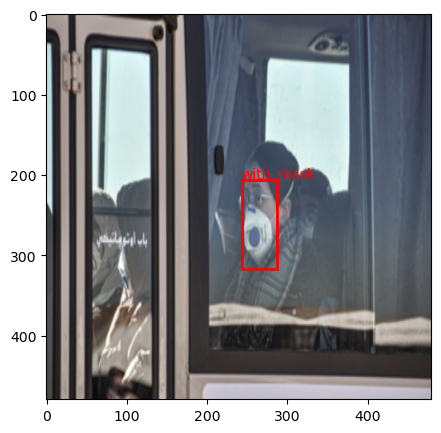

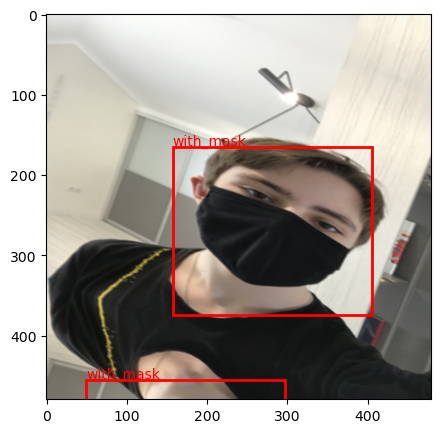

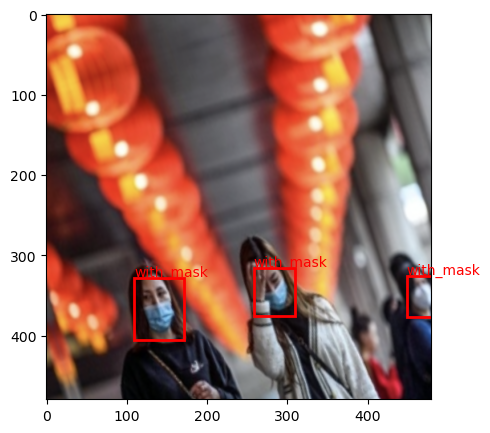

In [109]:
# Visualize the first batch of images with bounding boxes
images, targets = next(iter(data_loader))

for i in range(len(images)):
    img = images[i].permute(1, 2, 0).numpy()
    target = targets[i]
    plot_img_bbox(img, target)

## 4. Training the Faster RCNN Model

Update the model's last predicting layer.

In [110]:
def get_model_instance_segmentation(num_classes):
    model = fasterrcnn_resnet50_fpn(weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

Train the model.

In [ ]:
num_classes = len(classes)
model = get_model_instance_segmentation(num_classes)

num_epochs = 10

model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                                momentum=0.9, weight_decay=0.0005)

lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)
for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    for imgs, annotations in tqdm(data_loader):
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        loss_dict = model(imgs, annotations)
        losses = sum(loss for loss in loss_dict.values())        

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()         
        epoch_loss += losses.item()
    print('Epoch_loss = ',epoch_loss)


100%|██████████| 10/10 [02:35<00:00, 15.51s/it]


Epoch_loss =  10.08739110827446


100%|██████████| 10/10 [02:39<00:00, 15.90s/it]


Epoch_loss =  9.056174397468567


100%|██████████| 10/10 [02:35<00:00, 15.54s/it]

Epoch_loss =  6.384002923965454


## 5. Validating the Faster RCNN Model and Calculating the Metrics

Calculate Intersection over Union

In [75]:
def evaluate_iou_map(model, dataloader, device):
    model.eval()
    ious = []
    metric = MeanAveragePrecision()

    with torch.no_grad():
        for images, targets in dataloader:
            images = [img.to(device) for img in images]
            outputs = model(images)

            outputs = [{k: v.to(device) for k, v in t.items()} for t in outputs]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            metric.update(outputs, targets)

            for output, target in zip(outputs, targets):
                # Get predicted and true boxes
                pred_boxes = output['boxes'].to(device)
                true_boxes = target['boxes'].to(device)

                if len(pred_boxes) == 0 or len(true_boxes) == 0:
                    continue

                # Compute IoU matrix between all pairs
                iou_matrix = box_iou(pred_boxes, true_boxes)

                # Best IoU per predicted box
                best_ious, _ = iou_matrix.max(dim=1)
                ious.extend(best_ious.to(device).tolist())

    mean_iou = sum(ious) / len(ious)
    print(f"Mean IoU: {mean_iou:.4f}")
    
    mAP = metric.compute()
    print(f"Mean Average Precision (mAP): {mAP['map']:.4f}")

    return mean_iou, mAP['map'], mAP


evaluate_iou_map(model, data_loader_test, device)


Mean IoU: 0.1854
Mean Average Precision (mAP): 0.0843


(0.18535037883280944,
 tensor(0.0843),
 {'map': tensor(0.0843),
  'map_50': tensor(0.2468),
  'map_75': tensor(0.0183),
  'map_small': tensor(0.1339),
  'map_medium': tensor(0.0958),
  'map_large': tensor(0.3379),
  'mar_1': tensor(0.0471),
  'mar_10': tensor(0.1374),
  'mar_100': tensor(0.1615),
  'mar_small': tensor(0.1798),
  'mar_medium': tensor(0.1960),
  'mar_large': tensor(0.4250),
  'map_per_class': tensor(-1.),
  'mar_100_per_class': tensor(-1.),
  'classes': tensor([1, 2, 3], dtype=torch.int32)})

In [76]:
# the auxiliary function takes the initial forecast and the threshold iou

def apply_nms(orig_prediction, iou_thresh=0.3):
    
    keep = torchvision.ops.nms(orig_prediction['boxes'], orig_prediction['scores'], iou_thresh)
    
    final_prediction = orig_prediction
    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]
    
    return final_prediction

def torch_to_pil(img):
    return transforms.ToPILImage()(img).convert('RGB')

In [77]:
img, target = dataset_test[4]

model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])[0]
    
print('predicted #boxes: ', len(prediction['labels']))
print('real #boxes: ', len(target['labels']))

predicted #boxes:  100
real #boxes:  8


EXPECTED OUTPUT


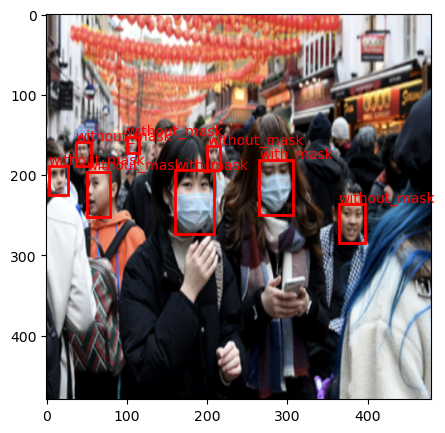

In [78]:
print('EXPECTED OUTPUT')
plot_img_bbox(torch_to_pil(img), target)

MODEL OUTPUT


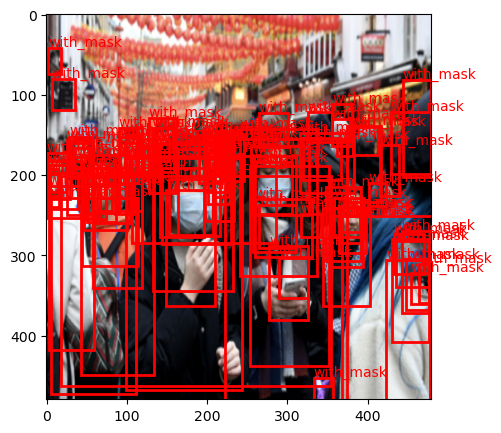

In [79]:
print('MODEL OUTPUT')
plot_img_bbox(torch_to_pil(img), prediction)

NMS APPLIED MODEL OUTPUT


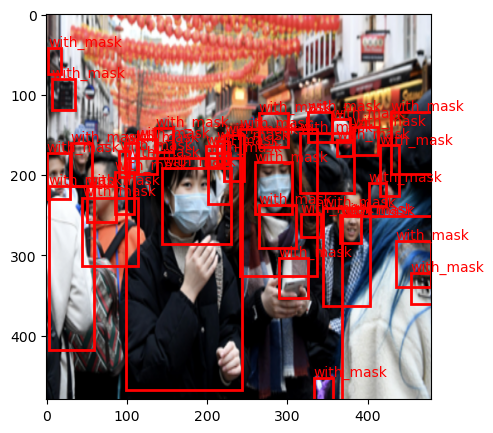

In [80]:
print('NMS APPLIED MODEL OUTPUT')
nms_prediction = apply_nms(prediction, iou_thresh=0.2)
plot_img_bbox(torch_to_pil(img), nms_prediction)

## 6. Rendering Images

In [87]:
def plot_image(img_tensor, annotation, predict=True):
    
    fig,ax = plt.subplots(1)
    fig.set_size_inches(18.5, 10.5)
    img = img_tensor.to(device).data
    mask_dic = {1: 'without_mask', 2: 'with_mask', 3: 'mask_weared_incorrect'}

    ax.imshow(img.permute(1, 2, 0))

    with torch.no_grad():       
        for i, box in enumerate(annotation["boxes"]):
            xmin, ymin, xmax, ymax = box

            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='r',facecolor='none')

            ax.add_patch(rect)
            label = mask_dic[int(annotation['labels'][i].data)]
            if predict:
                score = int((annotation['scores'][i].data) * 100)
                ax.text(xmin, ymin, f"{label} : {score}%", horizontalalignment='center', verticalalignment='center',fontsize=20,color='b')
            else:
                score=''
                ax.text(xmin, ymin, f"{label}", horizontalalignment='center', verticalalignment='center',fontsize=20,color='b')
        plt.show()

In [82]:
for imgs, annotations in data_loader:
    imgs = list(img.to(device) for img in imgs)
    annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
    break

In [83]:
model.eval()
preds = model(imgs)

Prediction


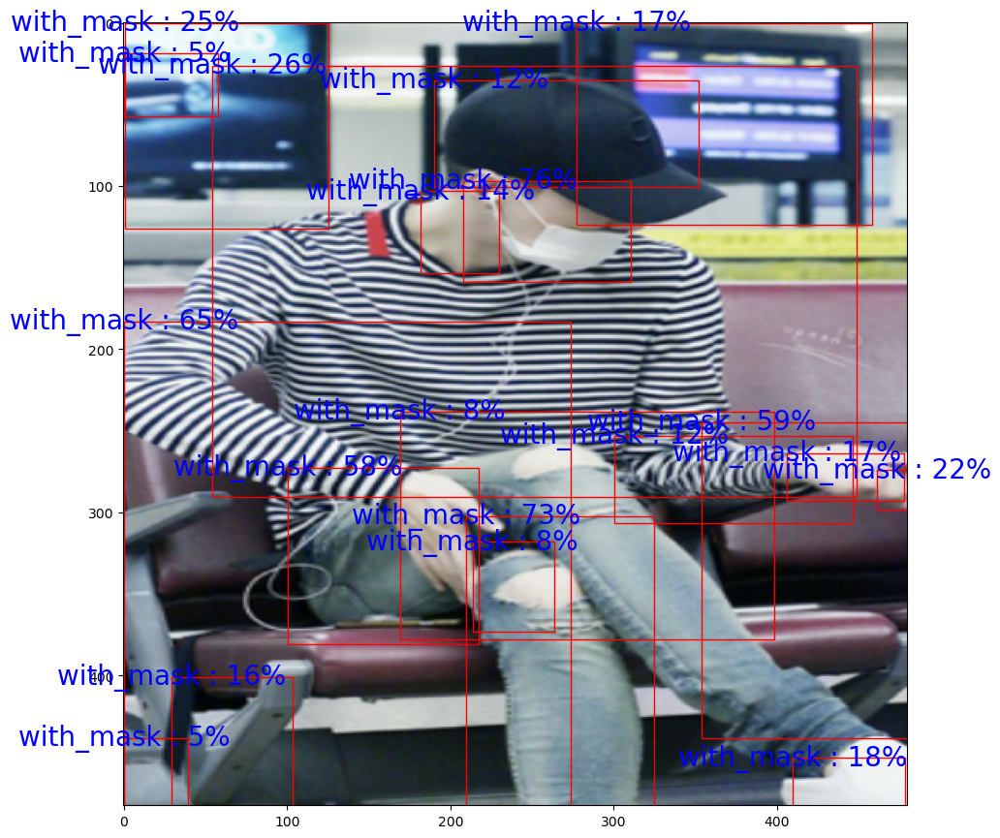

Target


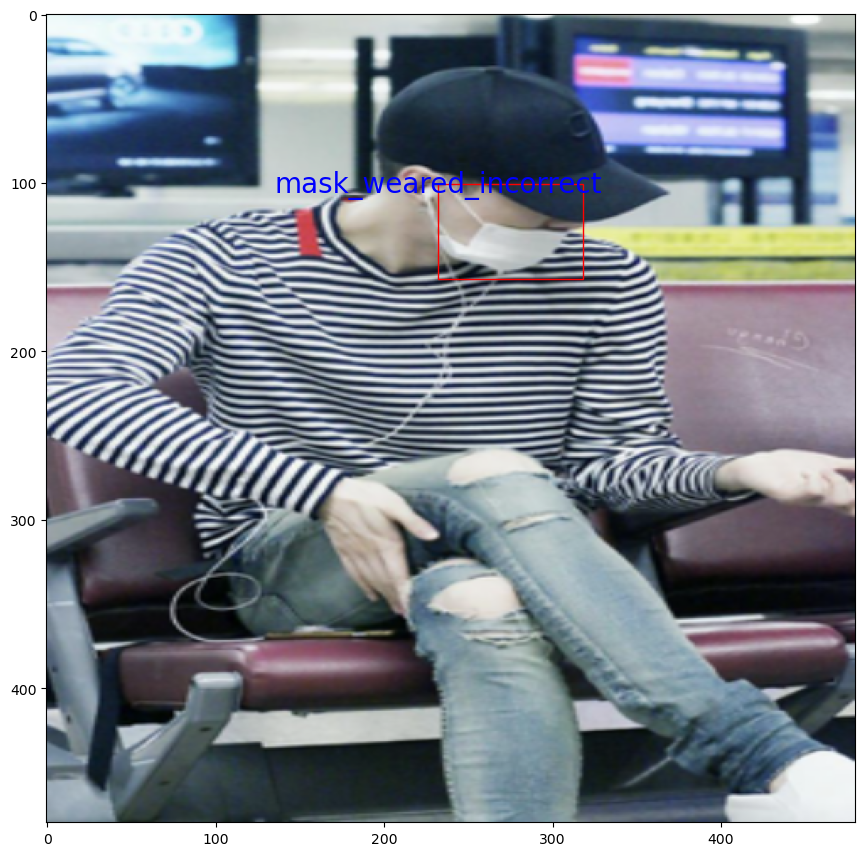

In [89]:
nms_prediction = apply_nms(preds[0], iou_thresh=0.2)
print("Prediction")
plot_image(imgs[0], nms_prediction)
print("Target")
plot_image(imgs[0].to('cpu'), annotations[0],False)

Prediction


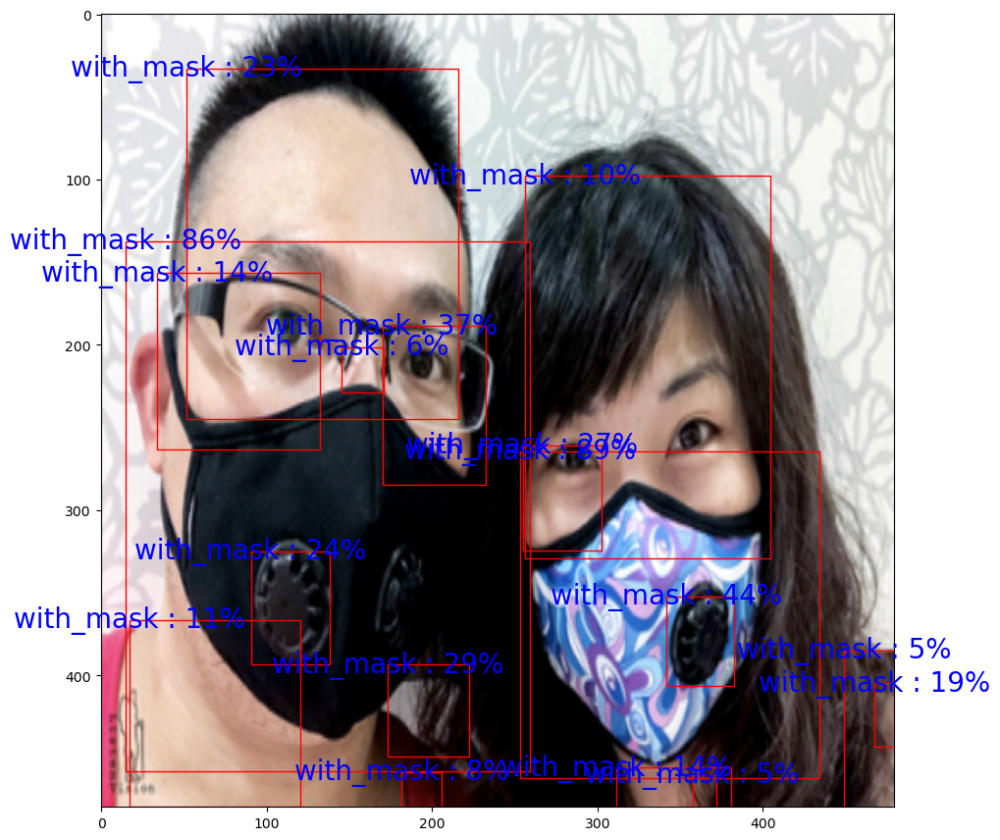

Target


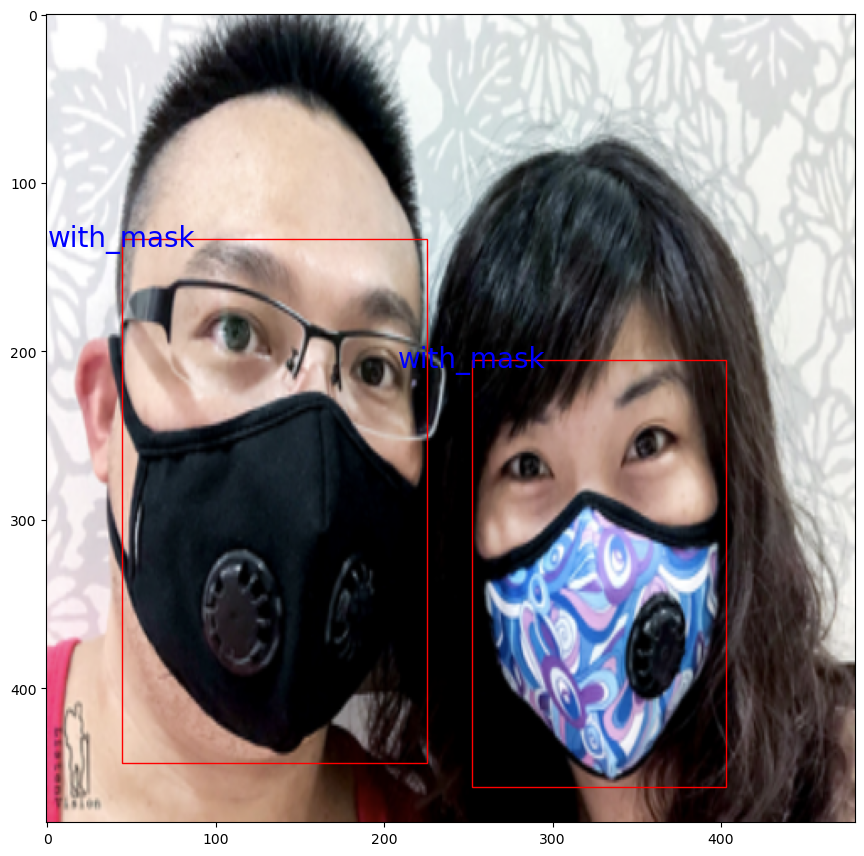

In [91]:
nms_prediction = apply_nms(preds[1], iou_thresh=0.2)
print("Prediction")
plot_image(imgs[1], nms_prediction)
print("Target")
plot_image(imgs[1].to('cpu'), annotations[1],False)

Prediction


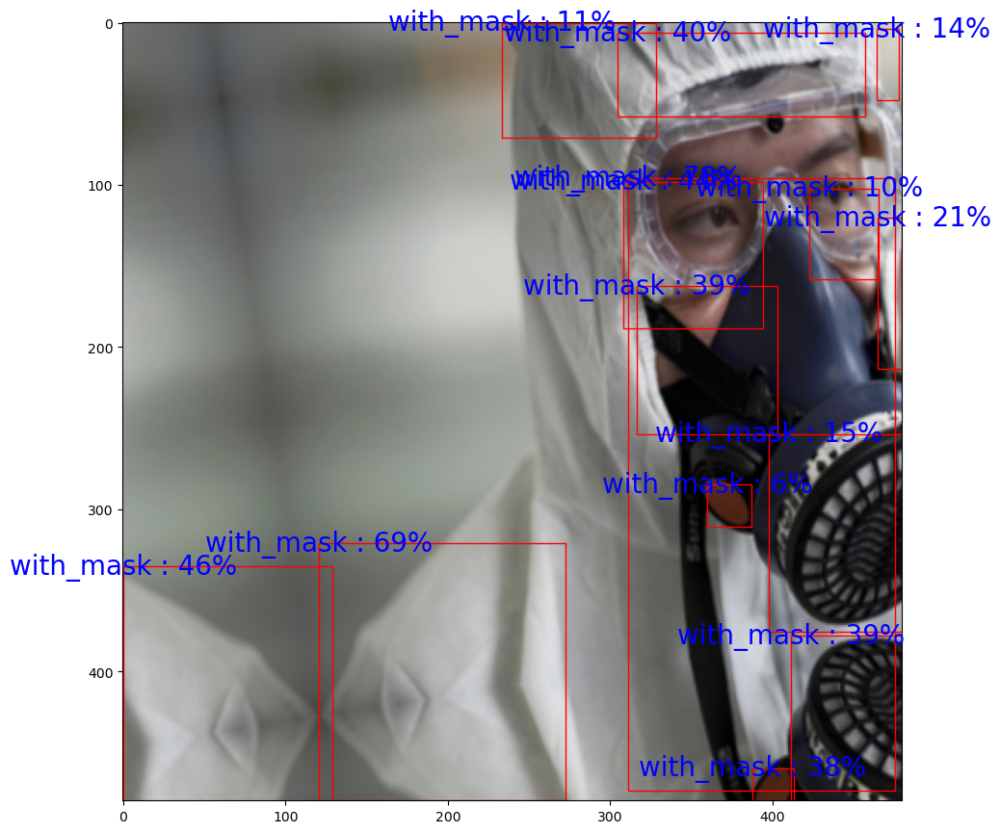

Target


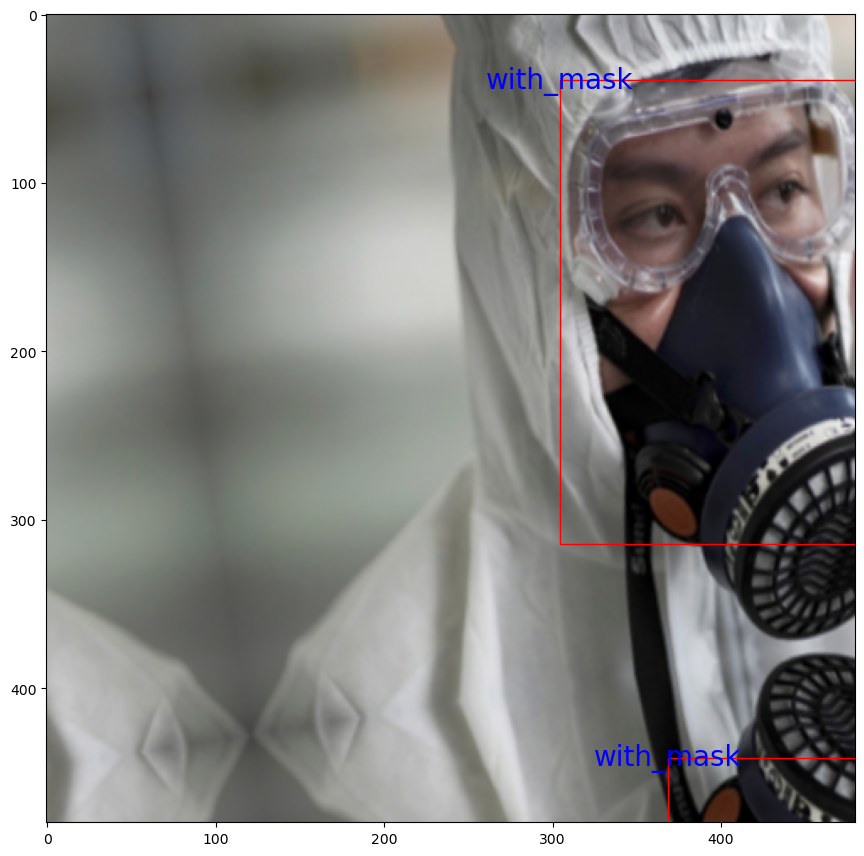

In [92]:
nms_prediction = apply_nms(preds[2], iou_thresh=0.2)
print("Prediction")
plot_image(imgs[2], nms_prediction)
print("Target")
plot_image(imgs[2].to('cpu'), annotations[2],False)

Prediction


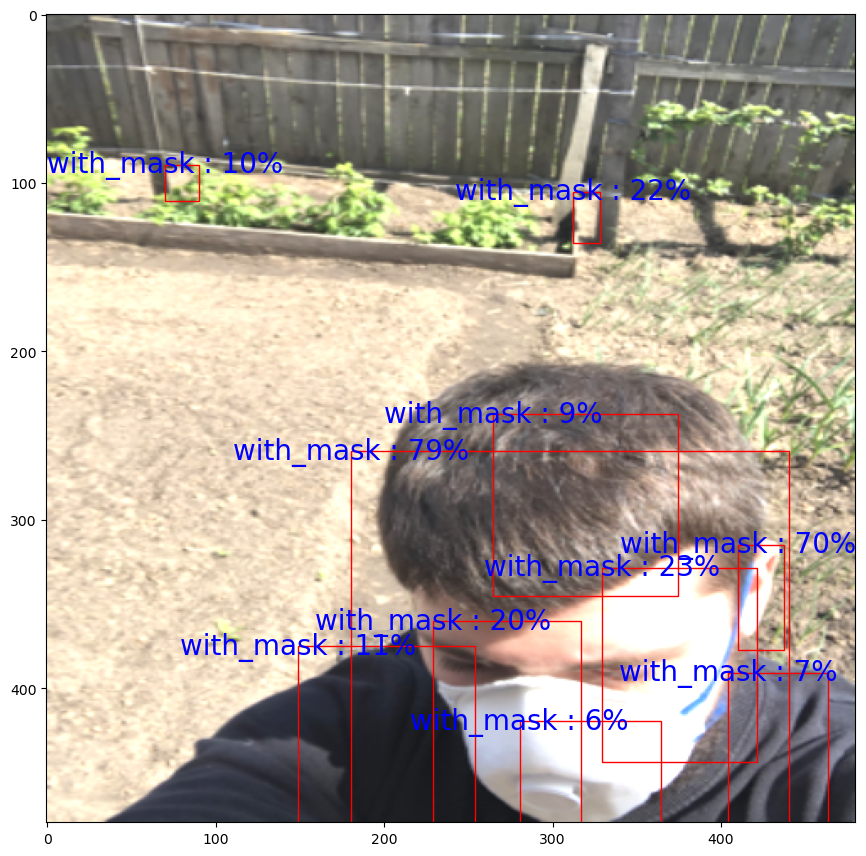

Target


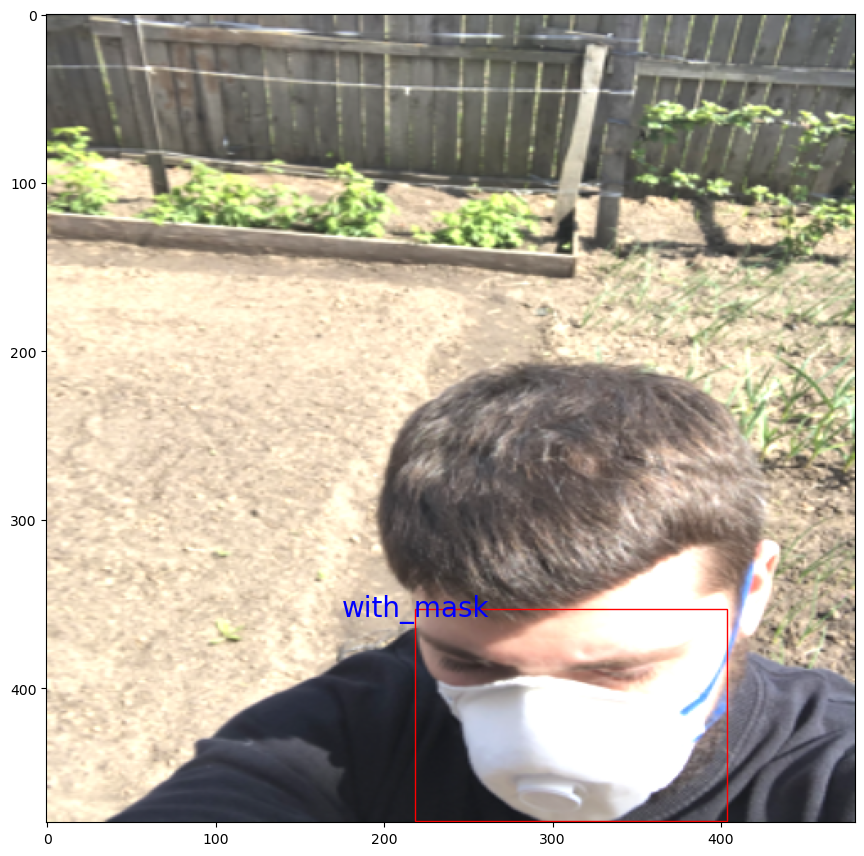

In [93]:
nms_prediction = apply_nms(preds[3], iou_thresh=0.2)
print("Prediction")
plot_image(imgs[3], nms_prediction)
print("Target")
plot_image(imgs[3].to('cpu'), annotations[3],False)